# Definitions

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import sys, platform, os
os.environ['OMP_NUM_THREADS'] = '8'
import matplotlib
import math
from matplotlib import pyplot as plt
import numpy as np
import euclidemu2
import scipy
import cosmolike_lsst_y1_interface as ci
from getdist import IniFile
from scipy.interpolate import interp1d
import itertools
import iminuit
import functools
print(sys.version)
print(os.getcwd())

# GENERAL PLOT OPTIONS
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
matplotlib.rcParams['xtick.bottom'] = True
matplotlib.rcParams['xtick.top'] = False
matplotlib.rcParams['ytick.right'] = False
matplotlib.rcParams['axes.edgecolor'] = 'black'
matplotlib.rcParams['axes.linewidth'] = '1.0'
matplotlib.rcParams['axes.labelsize'] = 'medium'
matplotlib.rcParams['axes.grid'] = True
matplotlib.rcParams['grid.linewidth'] = '0.0'
matplotlib.rcParams['grid.alpha'] = '0.18'
matplotlib.rcParams['grid.color'] = 'lightgray'
matplotlib.rcParams['legend.labelspacing'] = 0.77
matplotlib.rcParams['savefig.bbox'] = 'tight'
matplotlib.rcParams['savefig.format'] = 'pdf'
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------
# BE CAREFUL: you need texlive-latex-base texlive-latex-extra texlive-fonts-recommended dvipng ghostscript cm-super
matplotlib.rcParams['text.usetex'] = True
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------

# Jupyter Notebook Display options
import IPython
IPython.display.display(IPython.display.HTML("<style>:root { --jp-notebook-max-width: 85% !important; }</style>"))
IPython.display.display(IPython.display.HTML("<style>div.output_scroll { height: 54em; }</style>"))


Classy could not be found in your system.
Here are some suggestions:

	 -Download the Class from class-code.net and install it
	  together with its wrapper classy (type 'make' instead of
	  'make class'
	 -If you know that Class is installed on your system
	  and yet classy could not be installed, try re-compiling
	  Class with just ''make'' instead of ''make class''
NOTICE: Even without classy you can still use EuclidEmulator2
        to emulate boost factors. You won't be able to compute
        full power spectra, though.
3.11.12 | packaged by conda-forge | (main, Apr 10 2025, 22:18:52) [Clang 18.1.8 ]
/Users/vivianmiranda/data/COCOA/september2026/test/cocoa/Cocoa/projects/lsst_y1


In [2]:
# IMPORT CAMB
sys.path.insert(0, os.environ['ROOTDIR']+'/external_modules/code/CAMB/build/lib.linux-x86_64-'+os.environ['PYTHON_VERSION'])
import camb
from camb import model
print('Using CAMB %s installed at %s'%(camb.__version__,os.path.dirname(camb.__file__)))

# IMPORT SHARED NOTEBOOK UTILITIES (cosmolike_core)
sys.path.insert(0, os.environ['ROOTDIR']+'/external_modules/code/cosmolike_core')
import cosmolike_notebook_utils as cnu
print('Using cosmolike_notebook_utils installed at %s'%(os.path.dirname(cnu.__file__)))


Using CAMB 1.6.7 installed at /Users/vivianmiranda/data/COCOA/september2026/test/cocoa/Cocoa/.local/lib/python3.11/site-packages/camb
Using cosmolike_notebook_utils installed at /Users/vivianmiranda/data/COCOA/september2026/test/cocoa/Cocoa/external_modules/code/cosmolike_core/cosmolike_notebook_utils


In [3]:
CAMBAccuracyBoost = 1.0
non_linear_emul = 2
CLprobe="3x2pt"

path= "../../external_modules/data/lsst_y1"
data_file="lsst_y1_M1_GGL0.05.dataset"

IA_model = 0
IA_redshift_evolution = 3
IA_code = 0  # 0 = C FASTPT, 1 = Python FAST-PT (NLA always uses 0)

ntheta = 26 
theta_min_arcmin = 2.5 
theta_max_arcmin = 900

In [4]:
As_1e9 = 2.1
ns = 0.96605
H0 = 67.32
omegab = 0.04
omegam = 0.3
mnu = 0.06
LSST_DZ_S1 = 0.0414632
LSST_DZ_S2 = 0.00147332
LSST_DZ_S3 = 0.0237035
LSST_DZ_S4 = -0.0773436
LSST_DZ_S5 = -8.67127e-05
LSST_M1 = 0.0191832
LSST_M2 = -0.0431752
LSST_M3 = -0.034961
LSST_M4 = -0.0158096
LSST_M5 = -0.0158096
LSST_A1_1 = 0.606102
LSST_A1_2 = -1.51541
LSST_DZ_L1 = 0.00457604
LSST_DZ_L2 = 0.000309875
LSST_DZ_L3 = 0.00855907
LSST_DZ_L4 = -0.00316269
LSST_DZ_L5 = -0.0146753 
LSST_B1_1 = 1.72716
LSST_B1_2 = 1.65168
LSST_B1_3 = 1.61423
LSST_B1_4 = 1.92886
LSST_B1_5 = 2.11633
LSST_PM_1 = 0.0
LSST_PM_2 = 0.0
LSST_PM_3 = 0.0
LSST_PM_4 = 0.0
LSST_PM_5 = 0.0
w0pwa = -0.9
w = -0.9

In [5]:
# get_camb_cosmology lives in cosmolike_core, shared by every project's
# notebooks; call it as cnu.get_camb_cosmology (imported above). The
# shared version scales the chi(z) node count with the CAMB boost
# (this notebook's copy fixed it at 1250, identical at boost 1);
# this notebook's kmax choice of 5.0 is passed explicitly at the
# call sites that relied on the old default.


In [6]:
def C_gs_tomo_limber(ell, 
                     omegam = omegam, 
                     omegab = omegab, 
                     H0 = H0, 
                     ns = ns, 
                     As_1e9 = As_1e9, 
                     w = w, 
                     w0pwa = w0pwa,
                     A1  = [LSST_A1_1, LSST_A1_2, 0, 0, 0], 
                     A2  = [0, 0, 0, 0, 0],
                     BTA = [0, 0, 0, 0, 0],
                     shear_photoz_bias = [LSST_DZ_S1, LSST_DZ_S2, LSST_DZ_S3, LSST_DZ_S4, LSST_DZ_S5],
                     M = [LSST_M1, LSST_M2, LSST_M3, LSST_M4, LSST_M5],
                     lens_photoz_bias = [LSST_DZ_L1, LSST_DZ_L2, LSST_DZ_L3, LSST_DZ_L4, LSST_DZ_L5],
                     galaxy_bias_b1 = [LSST_B1_1, LSST_B1_2, LSST_B1_3, LSST_B1_4, LSST_B1_5],
                     galaxy_bias_b2 = [0,0,0,0,0],
                     galaxy_bias_bmag = [0,0,0,0,0],
                     galaxy_bias_b3nl = [0,0,0,0,0],
                     galaxy_bias_bk = [0,0,0,0,0],
                     baryon_sims = None,
                     AccuracyBoost = 1.0, 
                     kmax=5.0, 
                     k_per_logint=10,  
                     CAMBAccuracyBoost=1.0,
                     CLAccuracyBoost = 1.0, 
                     CLIntegrationAccuracy = 0,
                     non_linear_emul=non_linear_emul):

    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost,non_linear_emul=non_linear_emul)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + abs(3*(CLAccuracyBoost-1.0)))
    ci.init_ntable_lmax(int(50000 + 20000*(CLAccuracyBoost-1)))
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_bias(bias_model=[0,0,0,1,0])
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    
    ci.set_nuisance_shear_calib(M = M)
    ci.set_nuisance_shear_photoz(bias = shear_photoz_bias)
    ci.set_nuisance_ia(A1 = A1, A2 = A2, B_TA = BTA)
    
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = galaxy_bias_b3nl,
                         BK = galaxy_bias_bk)
   

    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)
    
    return ci.C_gs_tomo_limber(l = ell)

In [7]:
def C_gg_tomo(ell,
              limber,
              omegam = omegam, 
              omegab = omegab, 
              H0 = H0, 
              ns = ns, 
              As_1e9 = As_1e9, 
              w = w, 
              w0pwa = w0pwa,
              lens_photoz_bias = [LSST_DZ_L1, LSST_DZ_L2, LSST_DZ_L3, LSST_DZ_L4, LSST_DZ_L5],
              galaxy_bias_b1 = [LSST_B1_1, LSST_B1_2, LSST_B1_3, LSST_B1_4, LSST_B1_5],
              galaxy_bias_b2 = [0,0,0,0,0],
              galaxy_bias_bmag = [0,0,0,0,0],
              galaxy_bias_b3nl = [0,0,0,0,0],
              galaxy_bias_bk = [0,0,0,0,0],
              baryon_sims = None,
              AccuracyBoost = 1.0, 
              kmax=5.0, 
              k_per_logint=10, 
              CAMBAccuracyBoost=1.0,
              CLAccuracyBoost = 1.0, 
              CLIntegrationAccuracy = 0,
              non_linear_emul=non_linear_emul):

    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost,non_linear_emul=non_linear_emul)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + abs(3*(CLAccuracyBoost-1.0)))
    ci.init_ntable_lmax(int(50000 + 20000*(CLAccuracyBoost-1)))
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_bias(bias_model=[0,0,0,1,0]) 
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = galaxy_bias_b3nl,
                         BK = galaxy_bias_bk)
    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)

    if limber == 1:
        return ci.C_gg_tomo_limber(l = ell)
    else:
        return ci.C_gg_tomo(l = ell)

In [8]:
def gamma_t(ntheta = ntheta, 
            theta_min_arcmin = theta_min_arcmin, 
            theta_max_arcmin = theta_max_arcmin,
            omegam = omegam, 
            omegab = omegab, 
            H0 = H0, 
            ns = ns, 
            As_1e9 = As_1e9, 
            w = w, 
            w0pwa = w0pwa,
            A1  = [LSST_A1_1, LSST_A1_2, 0, 0, 0], 
            A2  = [0, 0, 0, 0, 0],
            BTA = [0, 0, 0, 0, 0],
            shear_photoz_bias = [LSST_DZ_S1, LSST_DZ_S2, LSST_DZ_S3, LSST_DZ_S4, LSST_DZ_S5],
            M = [LSST_M1, LSST_M2, LSST_M3, LSST_M4, LSST_M5],
            lens_photoz_bias = [LSST_DZ_L1, LSST_DZ_L2, LSST_DZ_L3, LSST_DZ_L4, LSST_DZ_L5],
            galaxy_bias_b1 = [LSST_B1_1, LSST_B1_2, LSST_B1_3, LSST_B1_4, LSST_B1_5],
            galaxy_bias_b2 = [0,0,0,0,0],
            galaxy_bias_bmag = [0,0,0,0,0],
            galaxy_bias_b3nl = [0,0,0,0,0],
            galaxy_bias_bk = [0,0,0,0,0],
            PM = [LSST_PM_1, LSST_PM_2, LSST_PM_3, LSST_PM_4, LSST_PM_5],
            baryon_sims = None,
            AccuracyBoost = 1.0, 
            kmax=5.0, 
            k_per_logint=10,
            CAMBAccuracyBoost=1.0,
            CLAccuracyBoost = 1.0, 
            CLIntegrationAccuracy = 0,
            non_linear_emul=non_linear_emul):
        
    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost,non_linear_emul=non_linear_emul)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + abs(3*(CLAccuracyBoost-1.0)))
    ci.init_ntable_lmax(int(50000 + 20000*(CLAccuracyBoost-1)))
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_binning(int(ntheta), theta_min_arcmin, theta_max_arcmin)
    ci.init_bias(bias_model=[0,0,0,1,0])
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    
    ci.set_nuisance_shear_calib(M = M)
    ci.set_nuisance_shear_photoz(bias = shear_photoz_bias)
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = galaxy_bias_b3nl,
                         BK = galaxy_bias_bk)
    ci.set_nuisance_ia(A1 = A1, A2 = A2, B_TA = BTA)
    ci.set_point_mass(PMV=PM) 

    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)
    
    return (ci.get_binning_real_space(), ci.w_gammat_tomo())  

In [9]:
def w_theta(ntheta = ntheta, 
            theta_min_arcmin = theta_min_arcmin, 
            theta_max_arcmin = theta_max_arcmin,
            omegam = omegam, 
            omegab = omegab, 
            H0 = H0, 
            ns = ns, 
            As_1e9 = As_1e9, 
            w = w, 
            w0pwa = w0pwa,
            lens_photoz_bias = [LSST_DZ_L1, LSST_DZ_L2, LSST_DZ_L3, LSST_DZ_L4, LSST_DZ_L5],
            galaxy_bias_b1 = [LSST_B1_1, LSST_B1_2, LSST_B1_3, LSST_B1_4, LSST_B1_5],
            galaxy_bias_b2 = [0,0,0,0,0],
            galaxy_bias_bmag = [0,0,0,0,0],
            galaxy_bias_b3nl = [0,0,0,0,0],
            galaxy_bias_bk = [0,0,0,0,0],
            baryon_sims = None,
            AccuracyBoost = 1.0, 
            kmax=5.0, 
            k_per_logint=10, 
            CAMBAccuracyBoost=1.0,
            CLAccuracyBoost=1.0, 
            CLIntegrationAccuracy = 0,
            non_linear_emul=non_linear_emul):

    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost,non_linear_emul=non_linear_emul)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + abs(3*(CLAccuracyBoost-1.0)))
    ci.init_ntable_lmax(int(50000 + 20000*(CLAccuracyBoost-1)))
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_binning(int(ntheta), theta_min_arcmin, theta_max_arcmin)
    ci.init_bias(bias_model=[0,0,0,1,0])
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = galaxy_bias_b3nl,
                         BK = galaxy_bias_bk)

    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)

    result = (ci.get_binning_real_space(), ci.w_gg_tomo())  
    return result 

In [10]:
# plot_C_gs_tomo_limber lives in cosmolike_core (shared); call it as
# cnu.plot_C_gs_tomo_limber (imported above). The shared version
# also fixes the panel-grid orientation for unequal lens/source bin
# counts (rows = source bins, columns = lens bins).


In [11]:
# plot_C_gg_tomo lives in cosmolike_core (shared); call it as
# cnu.plot_C_gg_tomo (imported above)


In [12]:
# plot_gammat_tomo_limber lives in cosmolike_core (shared); call it
# as cnu.plot_gammat_tomo_limber (imported above). The shared version
# also fixes the panel-grid orientation for unequal lens/source bin
# counts and takes thetashow for the x range.


In [13]:
# plot_wtheta_tomo lives in cosmolike_core (shared); call it as
# cnu.plot_wtheta_tomo (imported above)


In [14]:
# Init Cosmolike
ini = IniFile(os.path.normpath(os.path.join(path, data_file)))

lens_file = ini.relativeFileName('nz_lens_file')

source_file = ini.relativeFileName('nz_source_file')

lens_ntomo = ini.int("lens_ntomo")

source_ntomo = ini.int("source_ntomo")

ci.initial_setup()

ci.init_accuracy_boost(1.0, int(1))

ci.init_cosmo_runmode(is_linear = False)

ci.init_redshift_distributions_from_files(
      lens_multihisto_file=lens_file,
      lens_ntomo=int(lens_ntomo), 
      source_multihisto_file=source_file,
      source_ntomo=int(source_ntomo))

ci.init_IA( ia_model = int(IA_model), 
            ia_redshift_evolution = int(IA_redshift_evolution),
            ia_code = int(IA_code))

# Let's plot how cosmological and nuisance parameters affect $C_{\ell}^{gs}$

In [15]:
ell = np.arange(25., 2500., 3.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.2, 0.4, 0.02)
C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell, omegam=x))

/Users/vivianmiranda/data/COCOA/september2026/test/cocoa/Cocoa/external_modules/code/cosmolike_core/cosmolike_notebook_utils/plot_datavectors.py:583: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


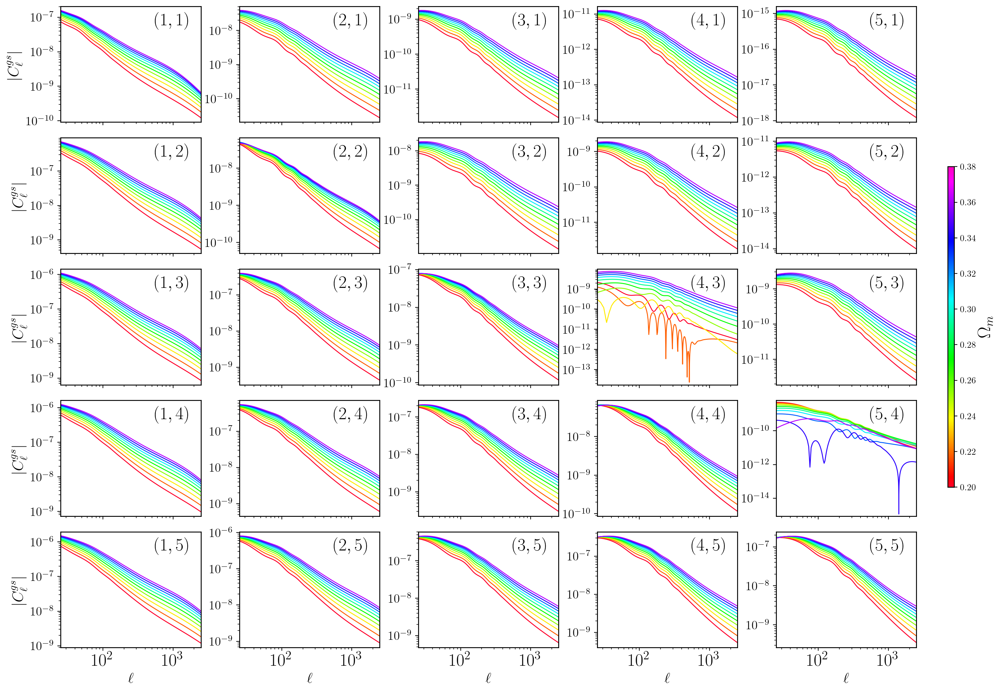

In [16]:
cnu.plot_C_gs_tomo_limber(ell=ell,
                          C_gs=np.abs(C_gs),
                          param=param,
                          colorbarlabel="$\Omega_m$",
                          bintextpos = [0.8, 0.875],
                          ylim = [0.75,1.3],
                          lmin=ell[0],
                          lmax=ell[len(ell)-1],
                          figsize = (21, 13),
                          bintextsize = 20,
                          yaxislabelsize = 17,
                          yaxisticklabelsize = 14,
                          xaxisticklabelsize = 20)

In [17]:
ell = np.arange(25., 2500., 3.) # Make sure arange are with float numbers (otherwise there are aliasing problems)
param = np.arange(0.85, 1.1, 0.02)
C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell, ns=x))

# Plot the Ratio over ref cosmology
ref = C_gs_tomo_limber(ell=ell)

/Users/vivianmiranda/data/COCOA/september2026/test/cocoa/Cocoa/external_modules/code/cosmolike_core/cosmolike_notebook_utils/plot_datavectors.py:583: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


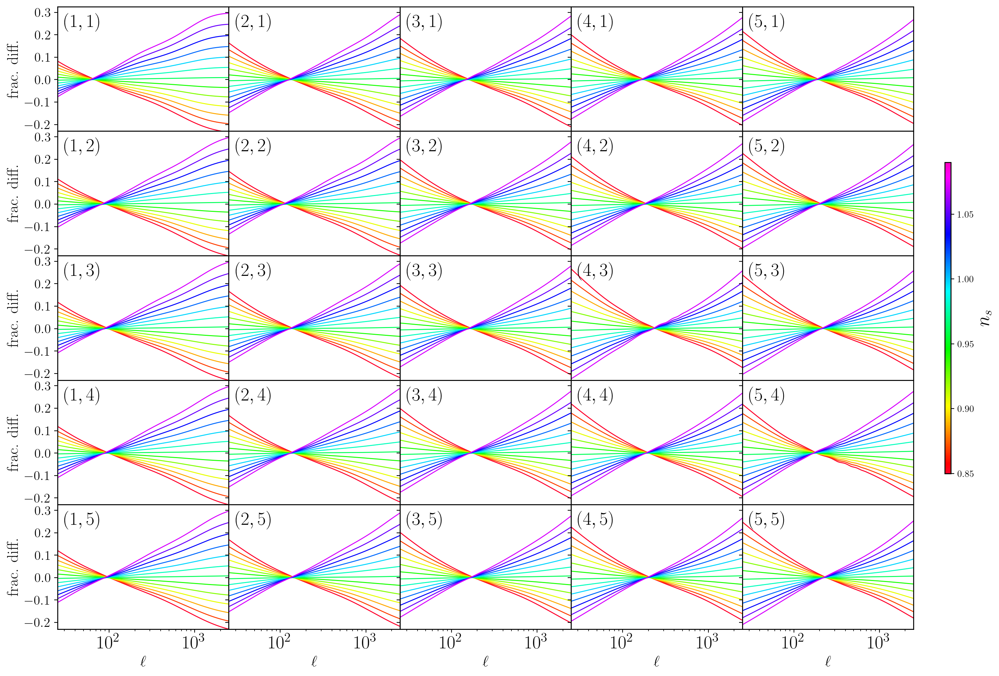

In [18]:
cnu.plot_C_gs_tomo_limber(ell=ell,
                          C_gs=C_gs,
                          C_gs_ref=ref,
                          param=param,
                          colorbarlabel="$n_s$",
                          bintextpos = [0.15, 0.875],
                          ylim = [0.77,1.325],
                          lmin=ell[0],
                          lmax=ell[len(ell)-1],
                          figsize = (20, 12),
                          bintextsize = 20,
                          yaxislabelsize = 17,
                          yaxisticklabelsize = 14,
                          xaxisticklabelsize = 20)

# Let's plot how cosmological and nuisance parameters affect $\gamma_t(\theta)$

In [19]:
param = np.arange(0.2, 0.4, 0.02)   
gammat_theta = []
for x in param:
    gammat_theta.append(gamma_t(omegam = x))

/Users/vivianmiranda/data/COCOA/september2026/test/cocoa/Cocoa/external_modules/code/cosmolike_core/cosmolike_notebook_utils/plot_datavectors.py:952: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


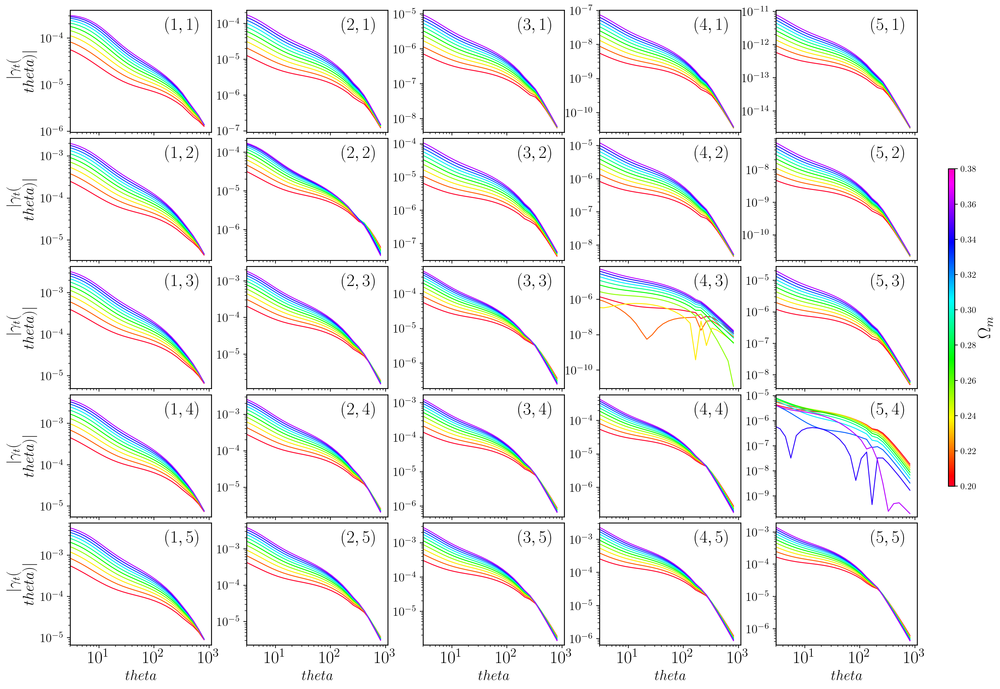

In [20]:
cnu.plot_gammat_tomo_limber(theta_gammat = gammat_theta,
                            gammat_ref = None,
                            param = param,
                            colorbarlabel = "$\Omega_m$",
                            bintextpos = [0.8, 0.875],
                            ylim = [0.75,1.3],
                            figsize = (21, 13),
                            bintextsize = 20,
                            yaxislabelsize = 17,
                            yaxisticklabelsize = 14,
                            xaxisticklabelsize = 20)

# Can we change the binning on $\gamma_t(\theta)$ w/o restarting the kernel? Yes!
Why this is a nontrivial question? Because Cosmolike uses static variables to cache internal variables

In [28]:
nthetas=[9, 12, 17, 44]
gammat_theta = []
for x in nthetas:
    gammat_theta.append(gamma_t(ntheta=x))

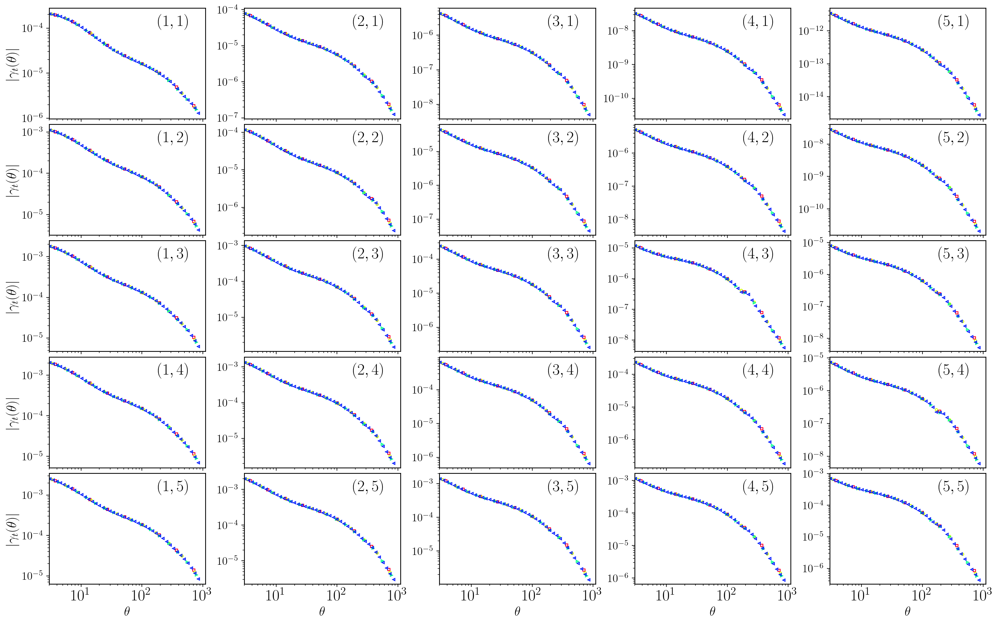

In [29]:
cnu.plot_gammat_tomo_limber(theta_gammat = gammat_theta,
                            marker=['s', 'o', ">", "<"],
                            ylim = [0.75,1.3],
                            bintextpos = [0.8, 0.875],
                            figsize = (21, 13),
                            bintextsize = 20,
                            yaxislabelsize = 17,
                            yaxisticklabelsize = 14,
                            xaxisticklabelsize = 20)

# Add Baryon Contamination to $C_{\ell}^{gs}$ and $\gamma_t(\theta)$ data vectors

In [23]:
ell = np.arange(3., 7500., 10.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = ("TNG100-1", "HzAGN-1", "mb2-1", "illustris-1", "eagle-1", "owls_AGN-1", "owls_AGN-2", "owls_AGN-3", "BAHAMAS-2")
    
C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell,baryon_sims=x))
    
# Plot the Ratio over ref cosmology
C_gs_ref = C_gs_tomo_limber(ell=ell)

gammat_theta = []
for x in param:
    gammat_theta.append(gamma_t(baryon_sims=x, ntheta=40, AccuracyBoost=1.0))
gammat_theta_ref = gamma_t(ntheta=40, AccuracyBoost=1.0)

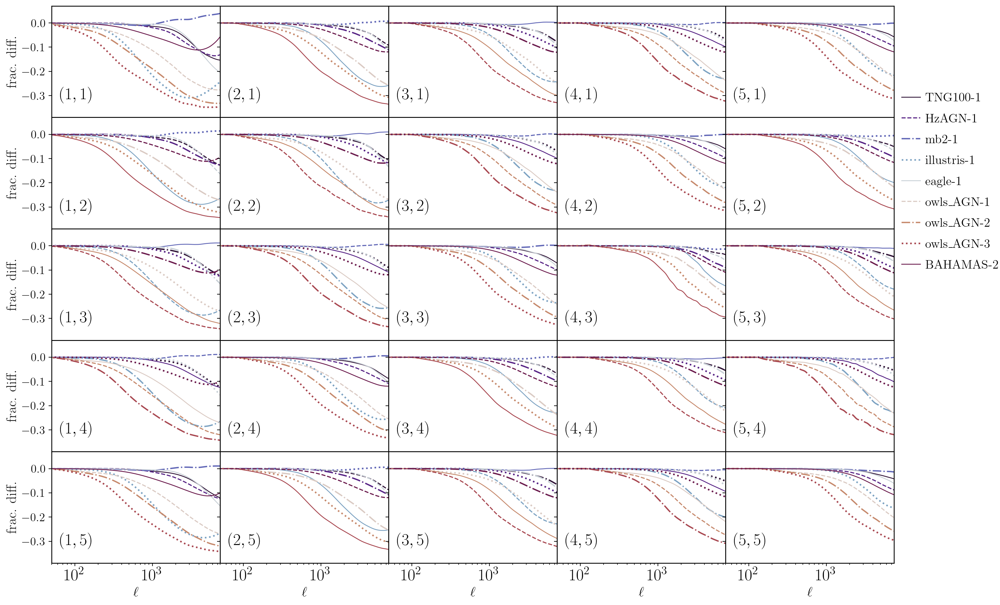

In [24]:
matplotlib.rcParams['legend.fontsize'] = 15
cnu.plot_C_gs_tomo_limber(ell=ell,
                          C_gs=C_gs,
                          C_gs_ref=C_gs_ref,
                          lmin=50,
                          lmax=ell[len(ell)-1],
                          cmap="twilight_shifted",
                          bintextpos = [0.15, 0.2],
                          ylim = [0.61,1.07],
                          legend = param,
                          legendloc=(0.9,0.55),
                          linewidth=[1.0, 1.3, 1.6, 1.9],
                          linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                          figsize = (18, 12),
                          bintextsize = 20,
                          yaxislabelsize = 17,
                          yaxisticklabelsize = 14,
                          xaxisticklabelsize = 20)

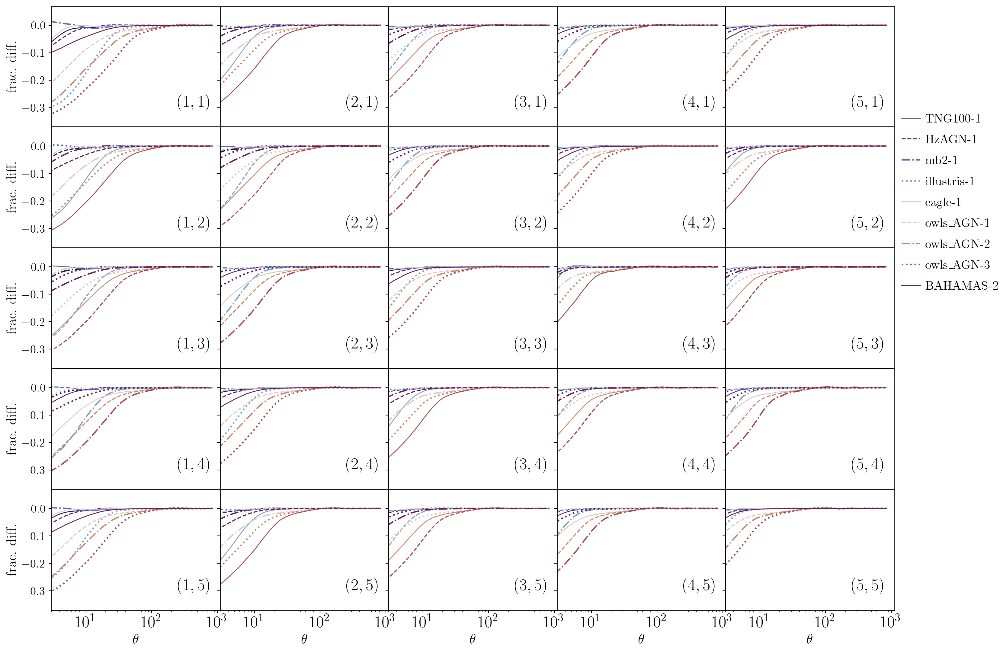

In [25]:
cnu.plot_gammat_tomo_limber(theta_gammat=gammat_theta,
                            gammat_ref=gammat_theta_ref,
                            cmap="twilight_shifted",
                            bintextpos = [0.85, 0.2],
                            ylim = [0.63,1.07],
                            legend = param,
                            legendloc=(0.9,0.55),
                            linewidth=[1.0, 1.3, 1.6, 1.9],
                            linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                            figsize = (18, 13),
                            bintextsize = 20,
                            yaxislabelsize = 17,
                            yaxisticklabelsize = 14,
                            xaxisticklabelsize = 20)

# Check how CAMB and Cosmolike Accuracy Boost affect $C_\ell^{\rm gs}$ and $\gamma_t(\theta)$ data vectors

In [53]:
ell = np.arange(10., 8500., 30.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0,6.0,0.5)

C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell,AccuracyBoost=1.0,CAMBAccuracyBoost=1.+x/3.,CLAccuracyBoost=1+x,CLIntegrationAccuracy=int(x)))
    
# Plot the Ratio over ref cosmology
C_gs_ref = C_gs_tomo_limber(ell=ell,AccuracyBoost=1.0,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0)

gammat_theta = []
for x in param:
    gammat_theta.append(gamma_t(ntheta=40,AccuracyBoost=1.0,CAMBAccuracyBoost=1.+x/3.,CLAccuracyBoost=1+x,CLIntegrationAccuracy=int(x)))
gammat_theta_ref = gamma_t(ntheta=40,AccuracyBoost=1.0,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0)

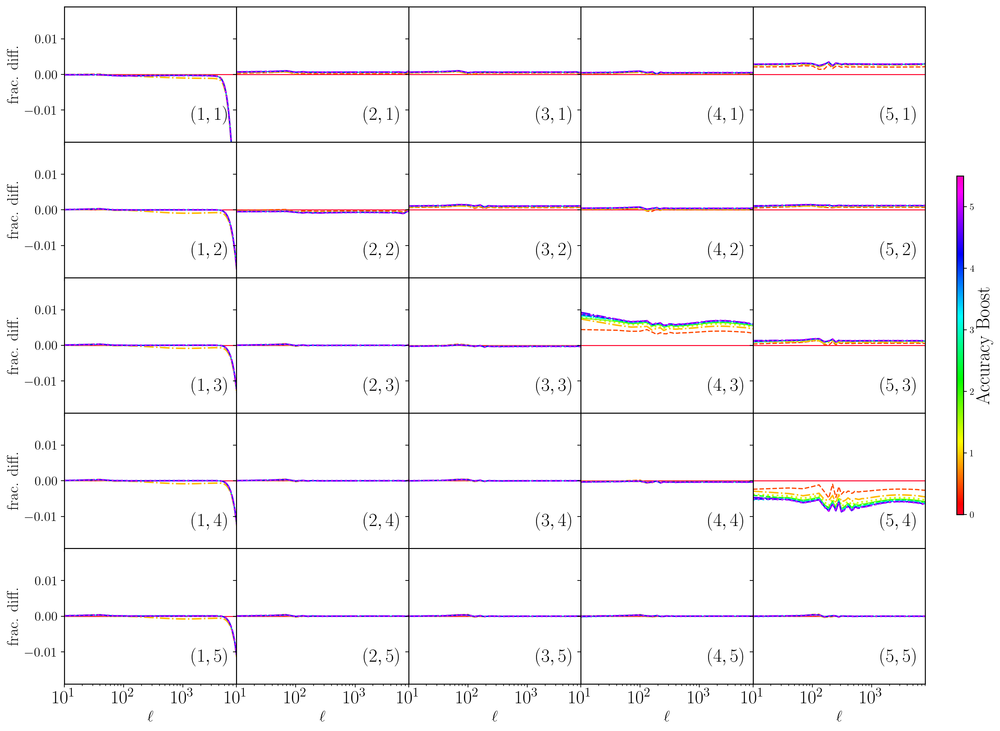

In [54]:
cnu.plot_C_gs_tomo_limber(ell=ell,
                          C_gs=C_gs,
                          C_gs_ref=C_gs_ref,
                          param=param,
                          lmin=10,
                          lmax=8000,
                          ylim=(0.981,1.019),
                          bintextpos = [0.85, 0.2],
                          colorbarlabel="Accuracy Boost",
                          linewidth=[1.0, 1.3, 1.6, 1.9],
                          linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                          figsize = (20, 13),
                          bintextsize = 20,
                          yaxislabelsize = 17,
                          yaxisticklabelsize = 14,
                          xaxisticklabelsize = 20)

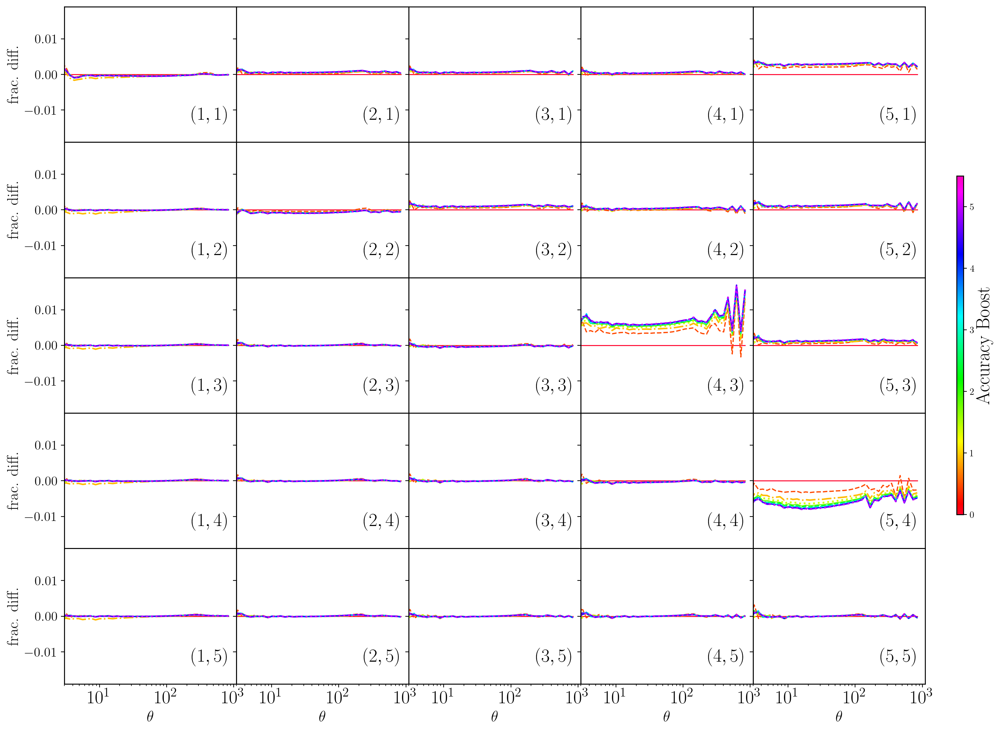

In [55]:
cnu.plot_gammat_tomo_limber(theta_gammat=gammat_theta,
                            gammat_ref=gammat_theta_ref,
                            bintextpos = [0.85, 0.2],
                            ylim = (0.981,1.019),
                            param=param,
                            legendloc=(0.9,0.55),
                            colorbarlabel="Accuracy Boost",
                            linewidth=[1.0, 1.3, 1.6, 1.9],
                            linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                            figsize = (20, 13),
                            bintextsize = 20,
                            yaxislabelsize = 17,
                            yaxisticklabelsize = 14,
                            xaxisticklabelsize = 20)

# Let's plot how cosmological and nuisance parameters affect $C_{\ell}^{gg}$ (Non-Limber/Limber)

In [15]:
ell = np.arange(3., 2500., 3.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.2, 0.4, 0.02)
C_gg_L = []
C_gg_NL = []
ratio = []
for x in param:
    tmp1 = C_gg_tomo(ell=ell, limber=1, omegam=x)
    tmp2 = C_gg_tomo(ell=ell, limber=0, omegam=x)
    C_gg_L.append(tmp1)
    C_gg_NL.append(tmp2)

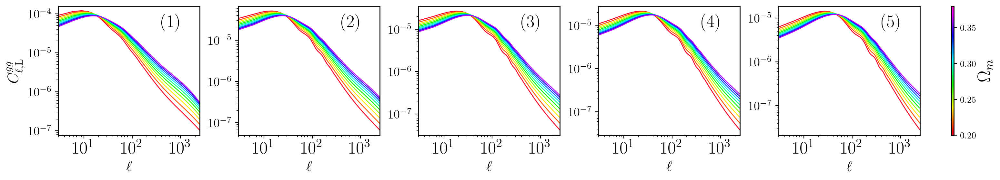

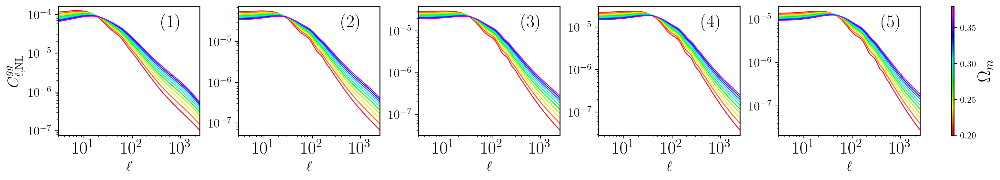

In [16]:
cnu.plot_C_gg_tomo(ell=ell,
                   C_gg=C_gg_L,
                   param=param,
                   colorbarlabel="$\Omega_m$",
                   bintextpos = [0.8, 0.875],
                   ylim = [0.75,1.3],
                   lmin=ell[0],
                   lmax=ell[len(ell)-1],
                   overwriteylabel="$C_{\ell,{\\rm L}}^{gg}$",
                   figsize = (21, 13./5),
                   bintextsize = 20,
                   yaxislabelsize = 17,
                   yaxisticklabelsize = 14,
                   xaxisticklabelsize = 20)
cnu.plot_C_gg_tomo(ell=ell,
                   C_gg=C_gg_NL,
                   param=param,
                   colorbarlabel="$\Omega_m$",
                   bintextpos = [0.8, 0.875],
                   ylim = [0.75,1.3],
                   lmin=ell[0],
                   lmax=ell[len(ell)-1],
                   overwriteylabel="$C_{\ell,{\\rm NL}}^{gg}$",
                   figsize = (21, 13./5),
                   bintextsize = 20,
                   yaxislabelsize = 17,
                   yaxisticklabelsize = 14,
                   xaxisticklabelsize = 20)

In [17]:
ell = np.arange(3., 250., 1.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.2, 0.4, 0.02)
ratio = []
for x in param:
    tmp1 = C_gg_tomo(ell=ell, limber=1, omegam=x)
    tmp2 = C_gg_tomo(ell=ell, limber=0, omegam=x)
    ratio.append(tmp2/tmp1)

/tmp/ipykernel_643209/2098546462.py:7: RuntimeWarning: invalid value encountered in divide
  ratio.append(tmp2/tmp1)


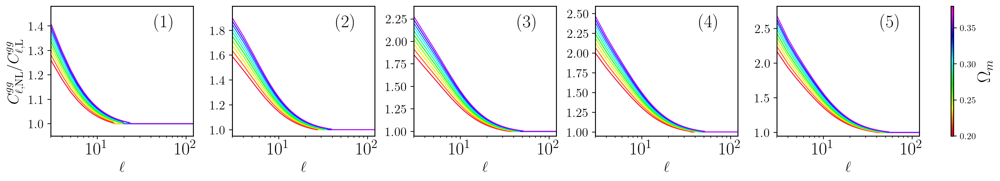

In [18]:
cnu.plot_C_gg_tomo(ell=ell,
                   C_gg=ratio,
                   param=param,
                   colorbarlabel="$\Omega_m$",
                   bintextpos = [0.8, 0.875],
                   ylim = [0.95,1.05],
                   lmin=3,
                   lmax=120,
                   forcelinearyscale=True,
                   overwriteylabel="$C_{\ell,{\\rm NL}}^{gg}/C_{\ell,{\\rm L}}^{gg}$",
                   forcelinearxscale=False,
                   marker=None,
                   figsize = (21, 13./5),
                   bintextsize = 20,
                   yaxislabelsize = 17,
                   yaxisticklabelsize = 14,
                   xaxisticklabelsize = 20)

# Let's plot how cosmological and nuisance parameters affect $w(\theta)$

In [35]:
param = np.arange(0.2, 0.4, 0.02)   
wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(omegam = x))

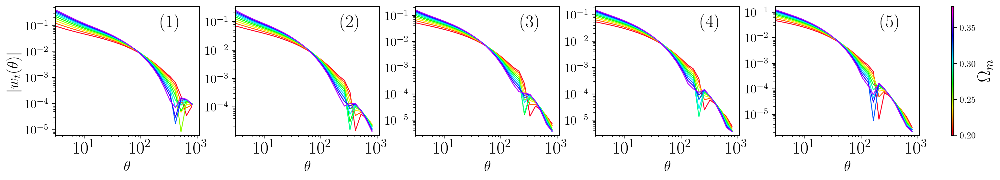

In [36]:
cnu.plot_wtheta_tomo(theta_wtheta = wtheta_theta,
                     theta_wtheta_ref = None,
                     param = param,
                     colorbarlabel = "$\Omega_m$",
                     bintextpos = [0.8, 0.875],
                     ylim = [0.75,1.3],
                     figsize = (21, 13./5),
                     bintextsize = 20,
                     yaxislabelsize = 17,
                     yaxisticklabelsize = 14,
                     xaxisticklabelsize = 20)

# Can we change the binning on $w(\theta)$ w/o restarting the kernel? Yes!
Why this is a nontrivial question? Because Cosmolike uses static variables to cache internal variables

In [117]:
nthetas=[9, 12, 17, 44]
wtheta_theta = []
for x in nthetas:
    wtheta_theta.append(w_theta(ntheta=x))

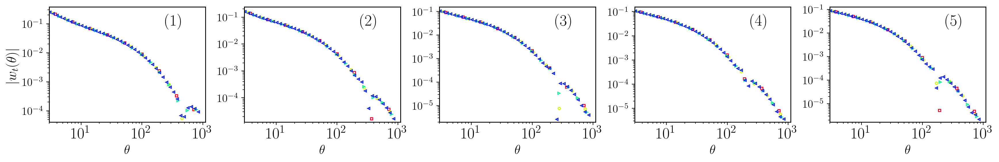

In [118]:
cnu.plot_wtheta_tomo(theta_wtheta=wtheta_theta,
                     marker=['s', 'o', ">", "<"],
                     ylim = [0.75,1.3],
                     bintextpos = [0.8, 0.875],
                     figsize = (21, 13./5),
                     bintextsize = 20,
                     yaxislabelsize = 17,
                     yaxisticklabelsize = 14,
                     xaxisticklabelsize = 20)

# Add Baryon Contamination to $C_{\ell}^{gg}$ and $w(\theta)$ data vectors

In [39]:
ell = np.arange(3., 7500., 10.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = ("TNG100-1", "HzAGN-1", "mb2-1", "illustris-1", "eagle-1", "owls_AGN-1", "owls_AGN-2", "owls_AGN-3", "BAHAMAS-2")
    
C_gg = []
for x in param:
    C_gg.append(C_gg_tomo(ell=ell,limber=False,baryon_sims=x))
    
# Plot the Ratio over ref cosmology
C_gg_ref = C_gg_tomo(ell=ell,limber=False)

wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(baryon_sims=x, ntheta=40, AccuracyBoost=1.0))
wtheta_theta_ref = w_theta(ntheta=40, AccuracyBoost=1.0)

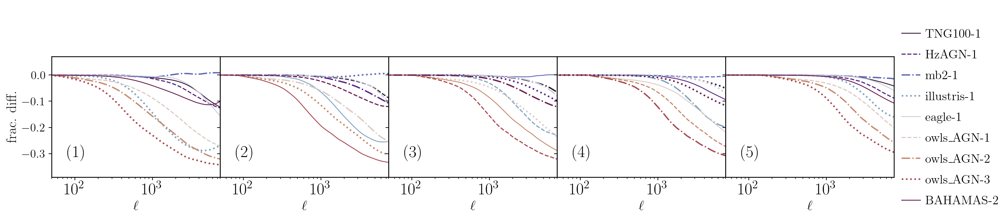

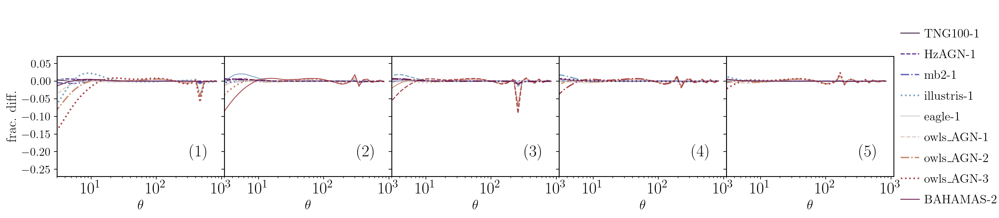

In [40]:
matplotlib.rcParams['legend.fontsize'] = 15
cnu.plot_C_gg_tomo(ell=ell,
                   C_gg=C_gg,
                   C_gg_ref=C_gg_ref,
                   lmin=50,
                   lmax=ell[len(ell)-1],
                   cmap="twilight_shifted",
                   bintextpos = [0.15, 0.2],
                   ylim = [0.61,1.07],
                   legend = param,
                   legendloc=(0.9,0.05),
                   linewidth=[1.0, 1.3, 1.6, 1.9],
                   linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                   figsize = (18, 13./5),
                   bintextsize = 20,
                   yaxislabelsize = 17,
                   yaxisticklabelsize = 14,
                   xaxisticklabelsize = 20)
cnu.plot_wtheta_tomo(theta_wtheta=wtheta_theta,
                     theta_wtheta_ref=wtheta_theta_ref,
                     cmap="twilight_shifted",
                     bintextpos = [0.85, 0.2],
                     ylim = [0.73,1.07],
                     legend = param,
                     legendloc=(0.9,0.05),
                     linewidth=[1.0, 1.3, 1.6, 1.9],
                     linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                     figsize = (18, 13./5),
                     bintextsize = 20,
                     yaxislabelsize = 17,
                     yaxisticklabelsize = 14,
                     xaxisticklabelsize = 20)

# Check how CAMB and Cosmolike Accuracy Boost affect $C_\ell^{\rm gg}$ and $w(\theta)$ data vectors

In [56]:
ell = np.arange(10., 8500., 30.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.6,6.0,0.5)
C_gg = []
for x in param:
    C_gg.append(C_gg_tomo(ell=ell,limber=False,AccuracyBoost=1,CAMBAccuracyBoost=1.+x/3,CLAccuracyBoost=1+x,CLIntegrationAccuracy=int(x)))
    
# Plot the Ratio over ref cosmology
C_gg_ref = C_gg_tomo(ell=ell,limber=False,AccuracyBoost=1,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0)

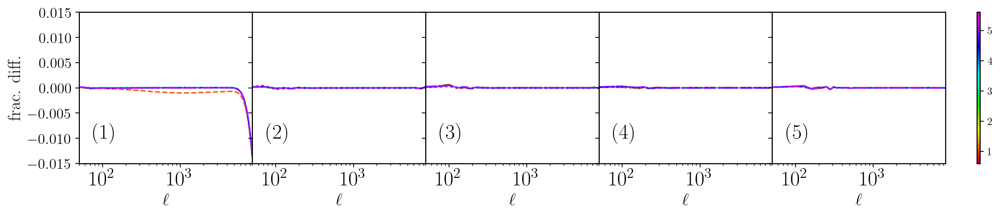

In [57]:
matplotlib.rcParams['legend.fontsize'] = 15
cnu.plot_C_gg_tomo(ell=ell,
                   C_gg=C_gg,
                   C_gg_ref=C_gg_ref,
                   lmin=50,
                   lmax=ell[len(ell)-1],
                   bintextpos = [0.15, 0.2],
                   ylim = [0.985,1.015],
                   param = param,
                   legendloc=(0.9,0.05),
                   linewidth=[1.0, 1.3, 1.6, 1.9],
                   linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                   figsize = (18, 13./5),
                   bintextsize = 20,
                   yaxislabelsize = 17,
                   yaxisticklabelsize = 14,
                   xaxisticklabelsize = 20)

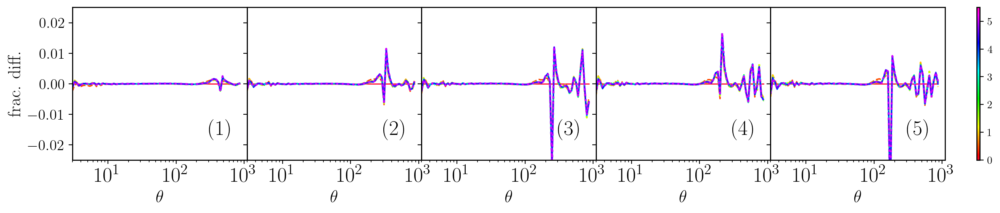

In [15]:
# HERE WE LEARN THAT FOR W(THETA), CAMB SHOULD HAVE ACCURACY BOOST=1.2
param = np.arange(0,6.0,0.5)

wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(ntheta=80,AccuracyBoost=1,CAMBAccuracyBoost=1.2+x/3,CLAccuracyBoost=1.0+x,CLIntegrationAccuracy=int(x)))
wtheta_theta_ref = w_theta(ntheta=80,AccuracyBoost=1,CAMBAccuracyBoost=1.2,CLAccuracyBoost=1.0,CLIntegrationAccuracy=0)
  
cnu.plot_wtheta_tomo(theta_wtheta=wtheta_theta,
                     theta_wtheta_ref=wtheta_theta_ref,
                     ylim = [0.975,1.025],
                     bintextpos = [0.85, 0.2],
                     param = param,
                     legendloc=(0.9,0.05),
                     linewidth=[1.0, 1.3, 1.6, 1.9],
                     linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                     figsize = (18, 13./5),
                     bintextsize = 20,
                     yaxislabelsize = 17,
                     yaxisticklabelsize = 14,
                     xaxisticklabelsize = 20)

# Let's compute $\chi^2_{\rm LSST}$ and reproduce the results shown on EXAMPLE_EVALUATE2.YAML

In [27]:
CLprobe="3x2pt"
path= "../../external_modules/data/lsst_y1"
data_file="lsst_y1_M1_GGL0.05.dataset"

IA_model = 0
IA_redshift_evolution = 3
IA_code = 0

ini = IniFile(os.path.normpath(os.path.join(path, data_file)))

ci.initial_setup()

ci.init_probes(possible_probes = CLprobe)

ci.init_binning(int(ini.int("n_theta")), 
                ini.float("theta_min_arcmin"), 
                ini.float("theta_max_arcmin"))

ci.init_cosmo_runmode(is_linear = False)

ci.init_IA( ia_model = int(IA_model), 
            ia_redshift_evolution = int(IA_redshift_evolution),
            ia_code = int(IA_code))

ci.init_redshift_distributions_from_files(
      lens_multihisto_file=ini.relativeFileName('nz_lens_file'),
      lens_ntomo=int(ini.int("lens_ntomo")), 
      source_multihisto_file=ini.relativeFileName('nz_source_file'),
      source_ntomo=int(ini.int("source_ntomo")))

ci.init_data_real(ini.relativeFileName('cov_file'), 
                  ini.relativeFileName('mask_file'), 
                  ini.relativeFileName('data_file'))

if CLprobe != "xi":
    ci.init_bias(bias_model=[0,0,0,1,0])

def get_chi2(omegam = omegam, 
             omegab = omegab, 
             H0 = H0, 
             ns = ns, 
             As_1e9 = As_1e9, 
             w = w, 
             w0pwa = w0pwa,
             A1  = [LSST_A1_1, LSST_A1_2, 0, 0, 0], 
             A2  = [0, 0, 0, 0, 0],
             BTA = [0, 0, 0, 0, 0],
             shear_photoz_bias = [LSST_DZ_S1, LSST_DZ_S2, LSST_DZ_S3, LSST_DZ_S4, LSST_DZ_S5],
             M = [LSST_M1, LSST_M2, LSST_M3, LSST_M4, LSST_M5],
             lens_photoz_bias = [LSST_DZ_L1, LSST_DZ_L2, LSST_DZ_L3, LSST_DZ_L4, LSST_DZ_L5],
             galaxy_bias_b1 = [LSST_B1_1, LSST_B1_2, LSST_B1_3, LSST_B1_4, LSST_B1_5],
             galaxy_bias_b2 = [0,0,0,0,0],
             galaxy_bias_bmag = [0,0,0,0,0],
             galaxy_bias_b3nl = [0,0,0,0,0],
             galaxy_bias_bk = [0,0,0,0,0],
             PM = [LSST_PM_1, LSST_PM_2, LSST_PM_3, LSST_PM_4, LSST_PM_5],
             baryon_sims = None,
             AccuracyBoost=1.0, 
             kmax=5.0, 
             k_per_logint=10, 
             CAMBAccuracyBoost=1.0,
             CLAccuracyBoost=1.0, 
             CLIntegrationAccuracy = 0,
             non_linear_emul=non_linear_emul):

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + abs(3*(CLAccuracyBoost-1.0)))
    ci.init_ntable_lmax(int(50000 + 20000*(CLAccuracyBoost-1)))
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))

    # Set Nuisance Parameters
    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost,non_linear_emul=non_linear_emul)
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)

    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = galaxy_bias_b3nl,
                         BK = galaxy_bias_bk)

    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)

    ci.set_point_mass(PMV=PM)
    
    ci.set_nuisance_shear_calib(M = M)

    ci.set_nuisance_shear_photoz(bias = shear_photoz_bias)

    ci.set_nuisance_ia(A1 = A1, 
                       A2 = A2, 
                       B_TA = BTA)

    datavector = np.array(ci.compute_data_vector_masked())
    return ci.compute_chi2(datavector)

In [23]:
print(rf"$\chi^2$={get_chi2():3.3f}")

$\chi^2$=0.425


# Let's compute $\chi^2_{\rm LSST}$ as function of CAMB and Cosmology Accuracy

In [24]:
param = np.arange(0,6,0.5)      
chi2 = []
for x in param:
    chi2.append(get_chi2(AccuracyBoost=1,CAMBAccuracyBoost=1.+x/3,CLAccuracyBoost=1+x,CLIntegrationAccuracy=int(x)))
chi2 = np.array(chi2)

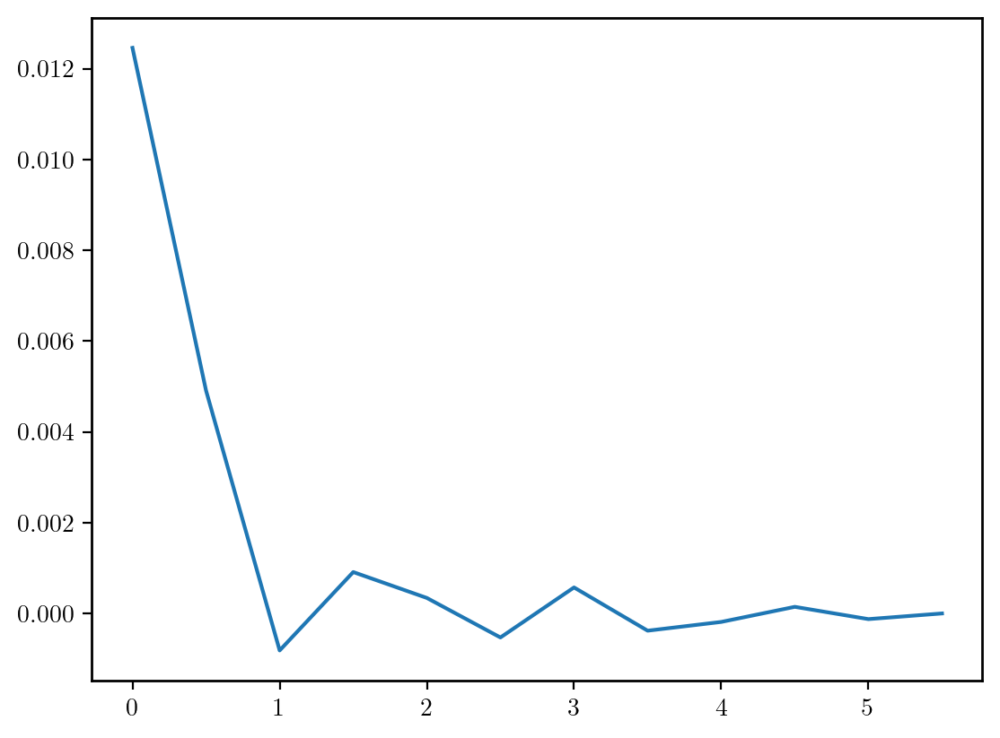

In [25]:
plt.plot(param, np.array(chi2-chi2[-1]))

# HALOFIT VS EE2

In [30]:
print(rf"$\chi^2$={get_chi2(non_linear_emul=1):3.3f}")
print(rf"$\chi^2$={get_chi2(non_linear_emul=2):3.3f}")

$\chi^2$=14.024
$\chi^2$=0.425


In [47]:
# HERE WE LEARN THAT FOR W(THETA), CAMB SHOULD HAVE ACCURACY BOOST=1.2
param = [1]
wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(ntheta=80,AccuracyBoost=1,CAMBAccuracyBoost=1.2,CLAccuracyBoost=1,CLIntegrationAccuracy=0,non_linear_emul=2))
wtheta_theta_ref = w_theta(ntheta=80,AccuracyBoost=1,CAMBAccuracyBoost=1.2,CLAccuracyBoost=1,CLIntegrationAccuracy=0,non_linear_emul=1)

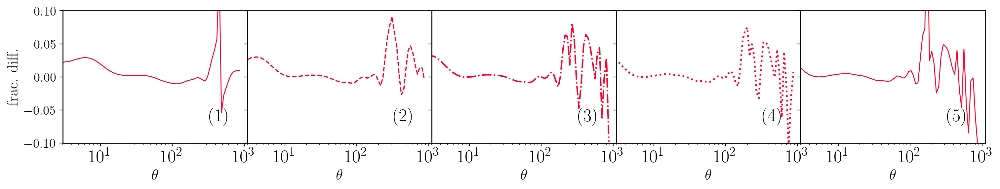

In [48]:
cnu.plot_wtheta_tomo(theta_wtheta=wtheta_theta,
                     theta_wtheta_ref=wtheta_theta_ref,
                     ylim = [0.9,1.1],
                     bintextpos = [0.85, 0.2],
                     param = param,
                     legendloc=(0.9,0.05),
                     linewidth=[1.0, 1.3, 1.6, 1.9],
                     linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                     figsize = (18, 13./5),
                     bintextsize = 20,
                     yaxislabelsize = 17,
                     yaxisticklabelsize = 14,
                     xaxisticklabelsize = 20,
                     colorbar=None)